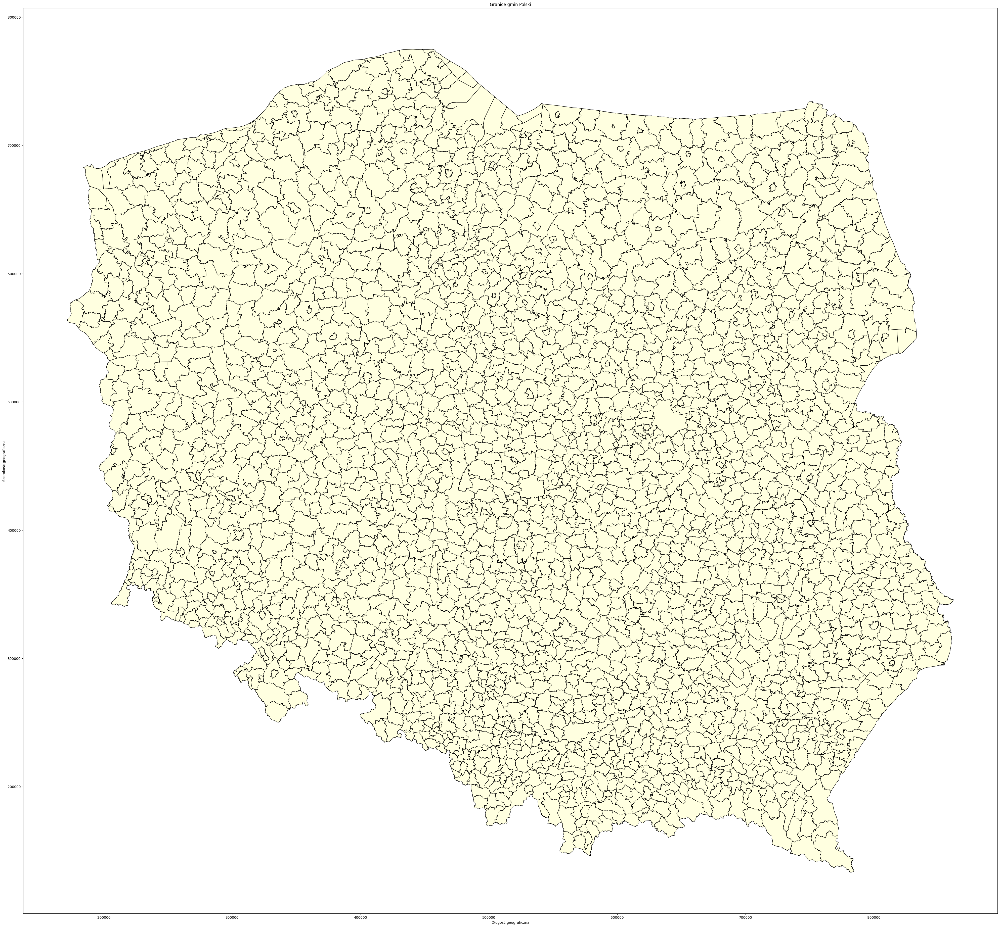

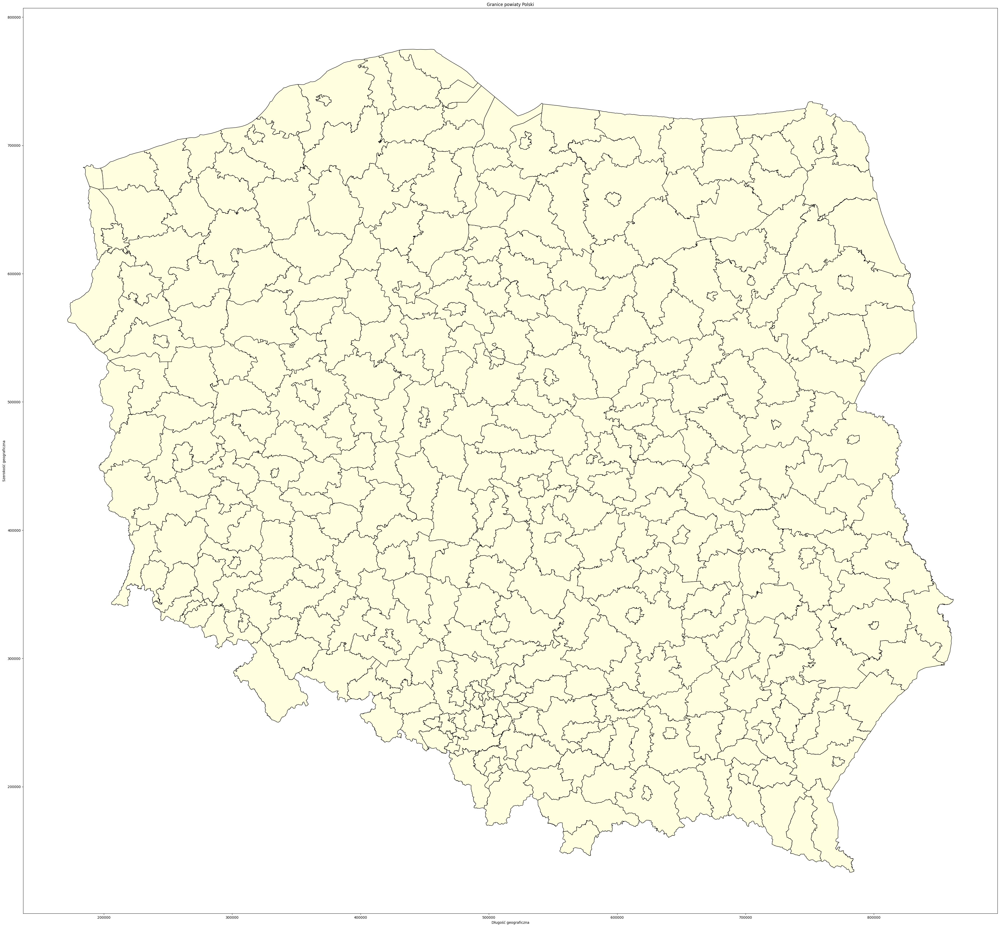

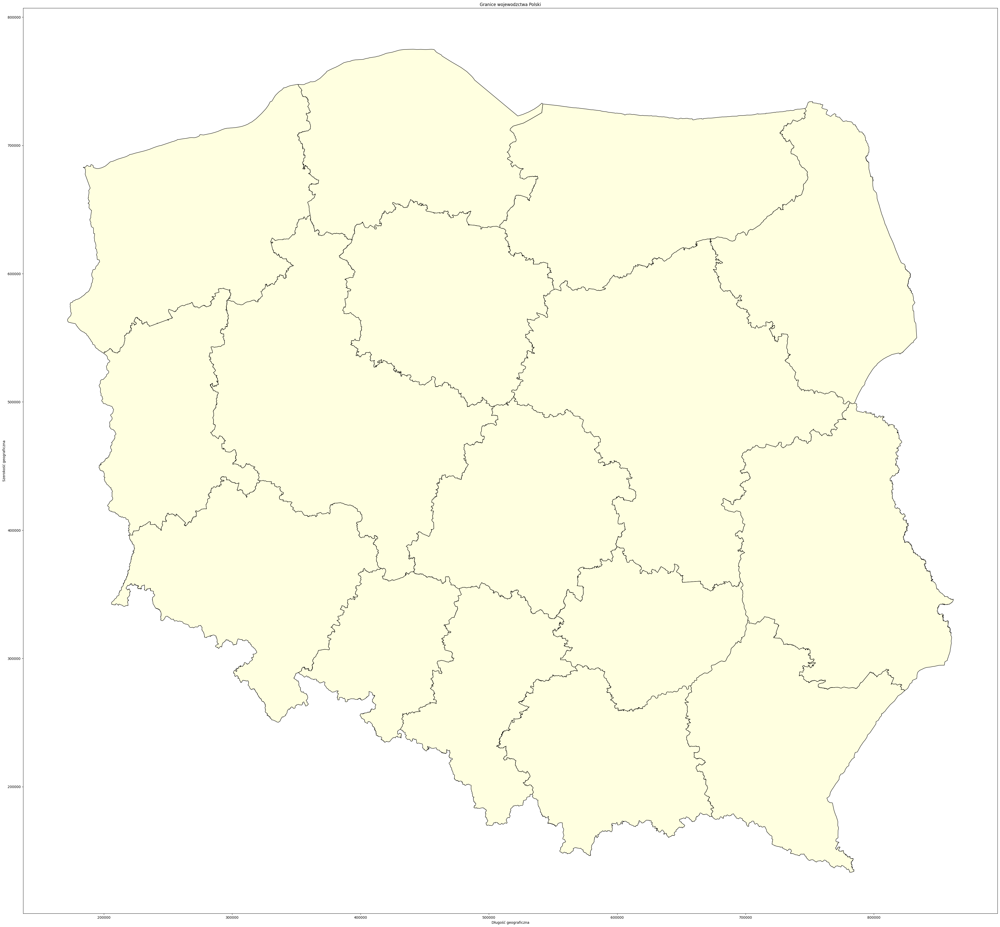

In [5]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Wczytaj plik .gml
gminy = gpd.read_file("datasets/ms_A03_Granice_gmin.gml")
powiaty = gpd.read_file("datasets/ms_A02_Granice_powiatow.gml")
wojewodzctwa = gpd.read_file("datasets/ms_A01_Granice_wojewodztw.gml")


gminy.plot(figsize=(50, 50), color='lightyellow', edgecolor='black')
plt.title('Granice gmin Polski')
plt.xlabel('Długość geograficzna')
plt.ylabel('Szerokość geograficzna')
plt.show()

powiaty.plot(figsize=(50, 50), color='lightyellow', edgecolor='black')
plt.title('Granice powiaty Polski')
plt.xlabel('Długość geograficzna')
plt.ylabel('Szerokość geograficzna')
plt.show()



wojewodzctwa.plot(figsize=(50, 50), color='lightyellow', edgecolor='black')
plt.title('Granice wojewodzctwa Polski')
plt.xlabel('Długość geograficzna')
plt.ylabel('Szerokość geograficzna')
plt.show()

Wynagrodzenia (pierwsze wiersze):
       Kod               Nazwa     2005     2006     2007     2008     2009
0  0200000        dolnośląskie  2493.52  2663.85  2924.29  3224.91  3386.15
1  0400000  kujawsko-pomorskie  2189.51  2324.54  2513.76  2761.03  2907.49
2  0600000           lubelskie  2185.59  2325.27  2541.86  2825.18  2962.37
3  0800000            lubuskie  2186.41  2306.53  2511.14  2747.87  2899.35
4  1000000             łódzkie  2225.13  2339.10  2536.40  2822.09  2976.52

Wydatki (pierwsze wiersze):
       Kod               Nazwa    2005    2006    2007    2008     2009
0  0200000        dolnośląskie  699.82  759.21  850.71  957.67  1013.17
1  0400000  kujawsko-pomorskie  602.66  674.26  736.34  798.05   875.59
2  0600000           lubelskie  629.51  678.14  705.21  810.70   826.98
3  0800000            lubuskie  717.48  771.91  816.44  934.38   937.90
4  1000000             łódzkie  731.81  774.12  839.69  922.37   997.73

Siła nabywcza (pierwsze wiersze):
    Rok      K

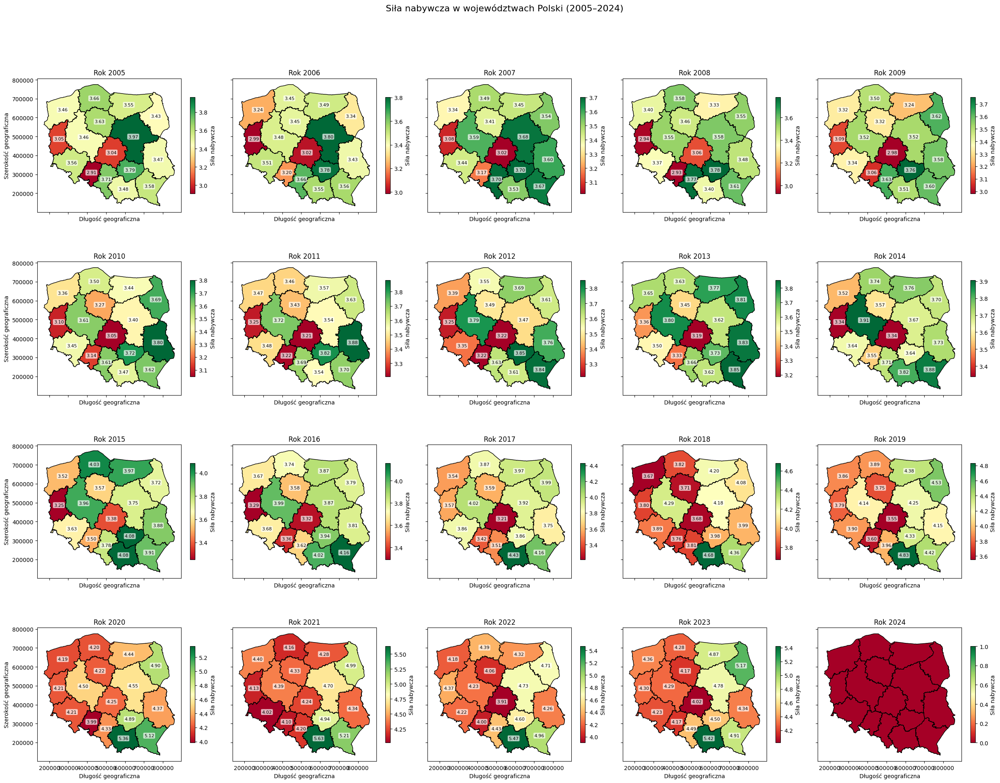


Wyniki zapisano do pliku: purchasing_power_voivodeships.csv


In [12]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# Wczytanie danych z plików CSV
try:
    wages_df = pd.read_csv("datasets/wynagrodzenia-wojewodzctwa-2005-2025.csv", sep=";", decimal=",")
    expenses_df = pd.read_csv("datasets/wydatki na osobe - 1998 - 2025.csv", sep=";", decimal=",")
except FileNotFoundError as e:
    print(f"Błąd: Nie znaleziono pliku: {e}")
    exit(1)

# Przetwarzanie danych wynagrodzeń
wages_df = wages_df.rename(columns=lambda x: x.split(";")[2] if "rok;ogółem" in x else x)
wages_df = wages_df[["Kod", "Nazwa"] + [str(year) for year in range(2005, 2025)]]
wages_df["Kod"] = wages_df["Kod"].astype(str).str.zfill(7)  # Ujednolicenie formatu kodu
wages_df["Nazwa"] = wages_df["Nazwa"].str.lower()  # Konwersja nazw na małe litery

# Przetwarzanie danych wydatków
expenses_df = expenses_df.rename(columns=lambda x: x.split(";")[1] if "ogółem" in x else x)
expenses_df = expenses_df[["Kod", "Nazwa"] + [str(year) for year in range(1998, 2025)]]
expenses_df["Kod"] = expenses_df["Kod"].astype(str).str.zfill(7)  # Ujednolicenie formatu kodu
expenses_df["Nazwa"] = expenses_df["Nazwa"].str.lower()  # Konwersja nazw na małe litery

# Diagnostyka: Sprawdzenie wczytanych danych
print("Wynagrodzenia (pierwsze wiersze):")
print(wages_df[["Kod", "Nazwa"] + [str(year) for year in range(2005, 2010)]].head())
print("\nWydatki (pierwsze wiersze):")
print(expenses_df[["Kod", "Nazwa"] + [str(year) for year in range(2005, 2010)]].head())

# Obliczenie siły nabywczej dla lat 2005–2024
years = [str(year) for year in range(2005, 2025)]
purchasing_power_data = []

for year in years:
    for _, row_wages in wages_df.iterrows():
        kod = row_wages["Kod"]
        nazwa = row_wages["Nazwa"]
        wages = row_wages[year] if year in row_wages and pd.notna(row_wages[year]) else None
        expenses_row = expenses_df[expenses_df["Kod"] == kod]
        if not expenses_row.empty and wages is not None and year in expenses_row.columns:
            expenses = expenses_row[year].iloc[0]
            if pd.notna(expenses) and expenses != 0:
                pp = wages / expenses
                purchasing_power_data.append({"Rok": year, "Kod": kod, "Nazwa": nazwa, "Siła nabywcza": pp})

# Tworzenie DataFrame z siłą nabywczą
pp_df = pd.DataFrame(purchasing_power_data)

# Diagnostyka: Sprawdzenie siły nabywczej
print("\nSiła nabywcza (pierwsze wiersze):")
print(pp_df.head())
print("\nZakres siły nabywczej dla każdego roku:")
print(pp_df.groupby("Rok")["Siła nabywcza"].agg(['min', 'max', 'mean', 'std']))

# Wczytanie mapy województw
try:
    wojewodztwa = gpd.read_file("datasets/ms_A01_Granice_wojewodztw.gml")
except Exception as e:
    print(f"Błąd wczytywania pliku GML: {e}")
    exit(1)

wojewodztwa["JPT_KOD_JE"] = wojewodztwa["JPT_KOD_JE"].astype(str).str.zfill(7)  # Ujednolicenie formatu kodu
wojewodztwa["JPT_NAZWA_"] = wojewodztwa["JPT_NAZWA_"].str.lower()  # Konwersja nazw na małe litery

# Diagnostyka: Sprawdzenie danych GML
print("\nDane GML (kolumny i pierwsze wiersze):")
print(wojewodztwa[["JPT_KOD_JE", "JPT_NAZWA_"]])

# Tworzenie map dla wszystkich lat (2005–2024)
n_years = len(years)
n_cols = 5
n_rows = (n_years + n_cols - 1) // n_cols  # Zaokrąglenie w górę
fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 5 * n_rows), sharex=True, sharey=True)
fig.suptitle("Siła nabywcza w województwach Polski (2005–2024)", fontsize=16)
axes = axes.flatten()  # Spłaszczenie tablicy osi dla łatwiejszego indeksowania

for i, year in enumerate(years):
    # Połączenie danych przestrzennych z siłą nabywczą na podstawie nazw
    pp_year = pp_df[pp_df["Rok"] == year][["Nazwa", "Siła nabywcza"]]
    merged = wojewodztwa.merge(pp_year, left_on="JPT_NAZWA_", right_on="Nazwa", how="left")

    # Wypełnienie brakujących danych wartością 0
    merged["Siła nabywcza"] = merged["Siła nabywcza"].fillna(0)

    # Dynamiczna normalizacja dla każdego roku
    pp_min = pp_year["Siła nabywcza"].min() if not pp_year.empty else 0
    pp_max = pp_year["Siła nabywcza"].max() if not pp_year.empty else 1
    norm = Normalize(vmin=pp_min, vmax=pp_max) if pp_max > pp_min else Normalize(vmin=0, vmax=1)

    # Diagnostyka: Sprawdzenie danych po połączeniu
    print(f"\nDane dla roku {year} po połączeniu:")
    print(merged[["JPT_KOD_JE", "JPT_NAZWA_", "Siła nabywcza"]])

    # Rysowanie mapy z paletą RdYlGn
    merged.plot(column="Siła nabywcza", ax=axes[i], cmap="RdYlGn", norm=norm, edgecolor="black")

    # Dodanie wartości siły nabywczej na mapie
    for idx, row in merged.iterrows():
        if row["Siła nabywcza"] != 0:  # Pomijanie województw bez danych
            # Obliczenie centroidu województwa
            centroid = row.geometry.centroid
            # Zaokrąglenie siły nabywczej do 2 miejsc po przecinku
            pp_value = f"{row['Siła nabywcza']:.2f}"
            # Dodanie tekstu na mapie
            axes[i].text(centroid.x, centroid.y, pp_value, fontsize=8, ha="center", va="center", color="black",
                         bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", boxstyle="round,pad=0.2"))

    axes[i].set_title(f"Rok {year}")
    axes[i].set_xlabel("Długość geograficzna")
    if i % n_cols == 0:
        axes[i].set_ylabel("Szerokość geograficzna")

    # Dodanie paska kolorów dla każdego roku
    sm = ScalarMappable(cmap="RdYlGn", norm=norm)
    plt.colorbar(sm, ax=axes[i], label="Siła nabywcza", shrink=0.5)

# Ukrycie pustych osi, jeśli są
for i in range(len(years), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Zapisanie wyników siły nabywczej do pliku CSV
pp_df.to_csv("purchasing_power_voivodeships.csv", index=False)
print("\nWyniki zapisano do pliku: purchasing_power_voivodeships.csv")